EDA - analiza zbiorów 

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from preprocess import Preprocess
import seaborn as sns
from nltk.probability import FreqDist
from wordcloud import WordCloud, ImageColorGenerator

MENTAL_HEALTH = './data/Mental-Health-Twitter.csv'
SUSPICIOUS_COMMUNICATION = './data/Suspicious Communication on Social Platforms.csv'
DISASTER = './data/disaster_tweets/train.csv'

In [28]:
df = pd.read_json('./results/disaster', lines=True)

In [4]:
def bin_classify(row: pd.DataFrame, column_name: str) -> int:
    """
    method classifies if given text is retweet or not
    :return: 1 if is retweet, 0 if not
    """
    return 0 if row[column_name]==[] else 1

In [30]:
df['hashtags_bin'] = df.apply(lambda row: bin_classify(row, 'hashtags'), axis=1)
df['emojis_bin'] = df.apply(lambda row: bin_classify(row, 'emojis'), axis=1)
df['links_bin'] = df.apply(lambda row: bin_classify(row, 'links'), axis=1)
df['references_bin'] = df.apply(lambda row: bin_classify(row, 'references'), axis=1)
df.head()

,id,keyword,location,text,target,links,is_retweet,retweet_of,references,hashtags,emojis,polarity,subjectivity,sentiment,hashtags_bin,emojis_bin,links_bin,references_bin
0,1,None,None,deed reason earthquake allah forgive,1,[],0,0,[],[earthquake],[],0.00000,0.0000,Neutral,1,0,0,0
1,4,None,None,forest fire range sask canada,1,[],0,0,[],[],[],0.10000,0.4000,Positive,0,0,0,0
2,5,None,None,resident asked shelter place notified officer ...,1,[],0,0,[],[],[],-0.01875,0.3875,Negative,0,0,0,0
3,6,None,None,13000 receive wildfire evacuation order califo...,1,[],0,0,[],[wildfires],[],0.00000,0.0000,Neutral,1,0,0,0
4,7,None,None,photo ruby alaska smoke wildfire pours school,1,[],0,0,[],"[Alaska, wildfires]",[],0.00000,0.0000,Neutral,1,0,0,0


In [6]:
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7613 entries, 0 to 7612
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              7613 non-null   int64  
 1   keyword         7552 non-null   object 
 2   location        5080 non-null   object 
 3   text            7613 non-null   object 
 4   target          7613 non-null   int64  
 5   links           7613 non-null   object 
 6   is_retweet      7613 non-null   int64  
 7   retweet_of      7613 non-null   object 
 8   references      7613 non-null   object 
 9   hashtags        7613 non-null   object 
 10  emojis          7613 non-null   object 
 11  polarity        7613 non-null   float64
 12  subjectivity    7613 non-null   float64
 13  sentiment       7613 non-null   object 
 14  hashtags_bin    7613 non-null   int64  
 15  emojis_bin      7613 non-null   int64  
 16  links_bin       7613 non-null   int64  
 17  references_bin  7613 non-null   i

,id,target,is_retweet,polarity,subjectivity,hashtags_bin,emojis_bin,links_bin,references_bin
count,7613.000000,7613.00000,7613.000000,7613.000000,7613.000000,7613.000000,7613.000000,7613.000000,7613.000000
mean,5441.934848,0.42966,0.002364,0.038622,0.302179,0.228950,0.001314,0.521608,0.261658
std,3137.116090,0.49506,0.048571,0.255865,0.322906,0.420185,0.036221,0.499566,0.439566
min,1.000000,0.00000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2734.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5408.000000,0.00000,0.000000,0.000000,0.218750,0.000000,0.000000,1.000000,0.000000
75%,8146.000000,1.00000,0.000000,0.100000,0.525000,0.000000,0.000000,1.000000,1.000000
max,10873.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Text(0.5, 1.0, 'Number of records by target')

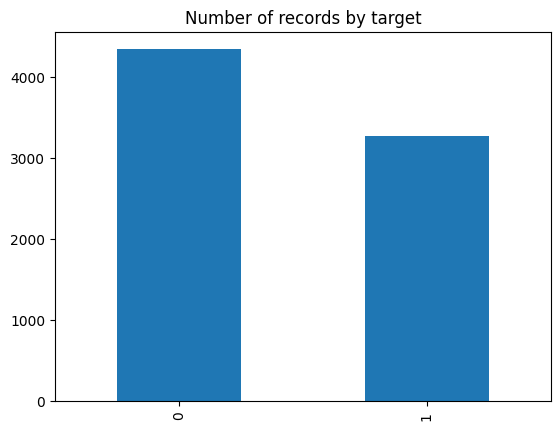

In [8]:
df['target'].value_counts().plot(kind='bar')
plt.title('Number of records by target')

In [9]:
df.isnull().sum()

id                   0
keyword             61
location          2533
text                 0
target               0
links                0
is_retweet           0
retweet_of           0
references           0
hashtags             0
emojis               0
polarity             0
subjectivity         0
sentiment            0
hashtags_bin         0
emojis_bin           0
links_bin            0
references_bin       0
dtype: int64

Text(0.5, 1.0, 'Polarity by target')

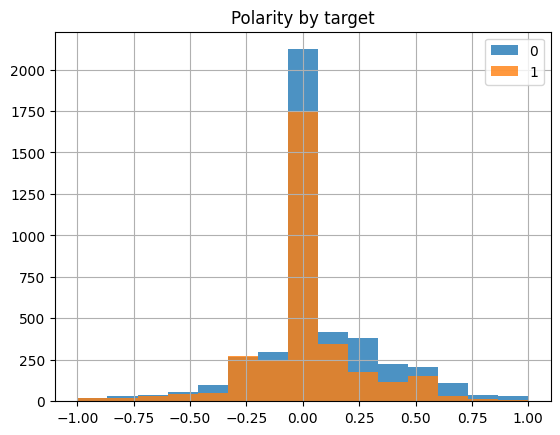

In [10]:
df_grouped = df.groupby('target')
df_grouped['polarity'].hist(alpha=0.8, bins=15, legend=True)
plt.title('Polarity by target')

Text(0.5, 1.0, 'Subjectivity by target')

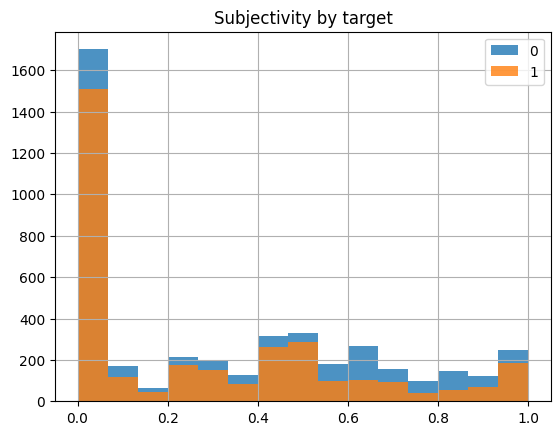

In [11]:
df_grouped = df.groupby('target')
df_grouped['subjectivity'].hist(alpha=0.8, bins=15, legend=True )
plt.title('Subjectivity by target')

Text(0.5, 1.0, 'Sentiment by target')

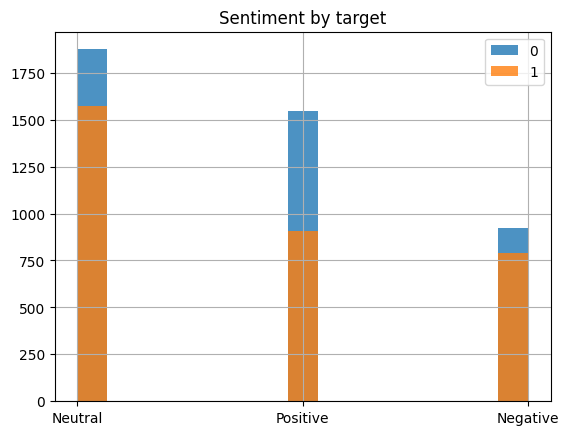

In [12]:
df_grouped = df.groupby('target')
df_grouped['sentiment'].hist(alpha=0.8, bins=15, legend=True )
plt.title('Sentiment by target')

<AxesSubplot: >

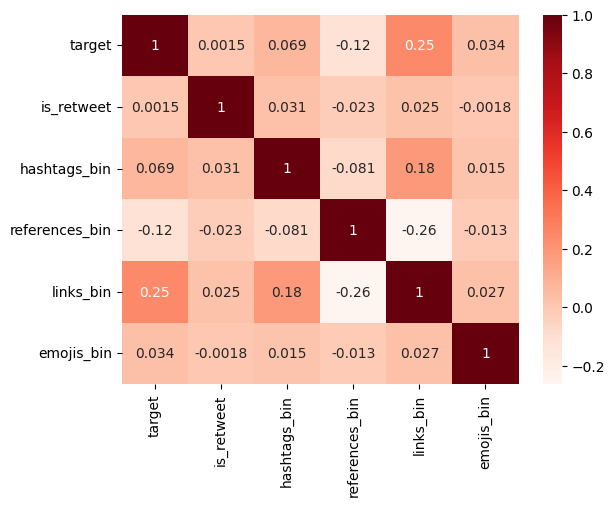

In [13]:
sns.heatmap(df[['target', 'is_retweet','hashtags_bin','references_bin','links_bin','emojis_bin']].corr(), annot=True, cmap='Reds')

<AxesSubplot: title={'center': 'Link presence with target = 1'}>

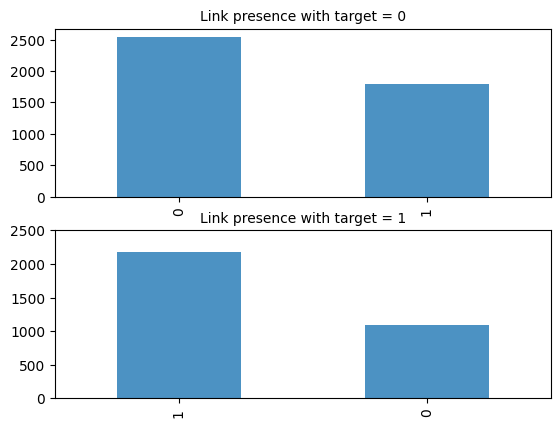

In [24]:
df_grouped = df.groupby('target')
plt.subplot(2,1,1)
plt.title('Link presence with target = 0', fontsize=10)
df_grouped['links_bin'].get_group(0).value_counts().plot(kind='bar', alpha=0.8, xticks=(0,1))
plt.subplot(2,1,2)
plt.title('Link presence with target = 1',fontsize=10)
df_grouped['links_bin'].get_group(1).value_counts().plot(kind='bar', alpha=0.8, ylim=(0,2500))

Text(0.5, 1.0, 'Top 20 Locations')

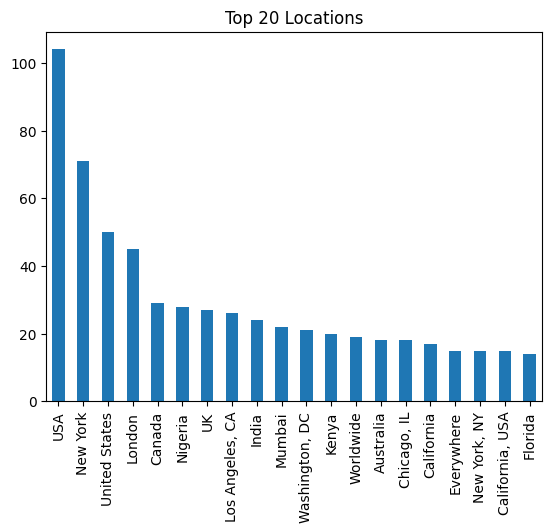

In [94]:
df['location'].value_counts().head(20).plot(kind='bar')
plt.title('Top 20 Locations')

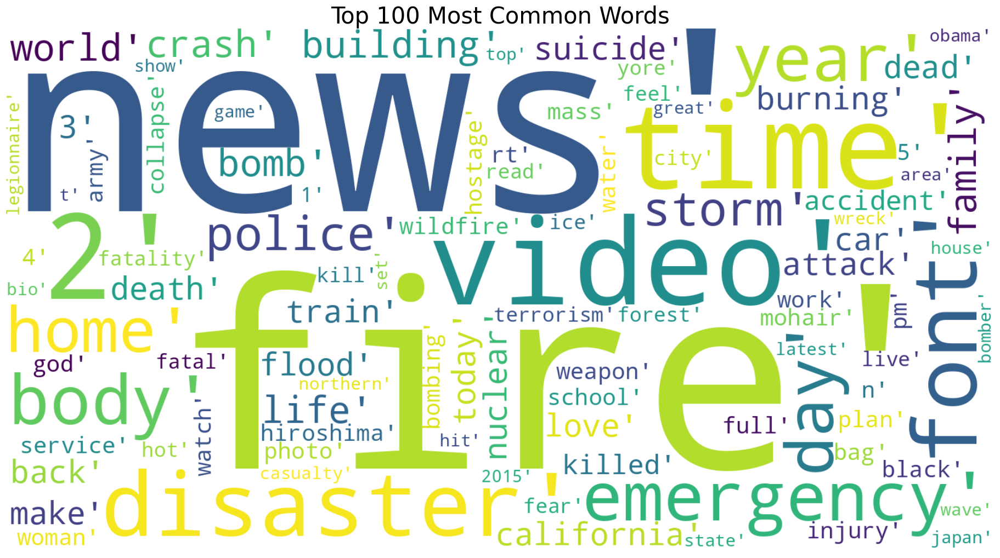

In [106]:
df_notempty = df.loc[df['text'] != ""]
allwords = df['text'].str.split("[^\w+]").explode().tolist()
mostcommon = FreqDist(allwords).most_common(100)

wordcloud = WordCloud(width=1600, height=850, background_color='white').generate(str(mostcommon))
fig = plt.figure(figsize=(30,10), facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=30)
plt.tight_layout(pad=0)

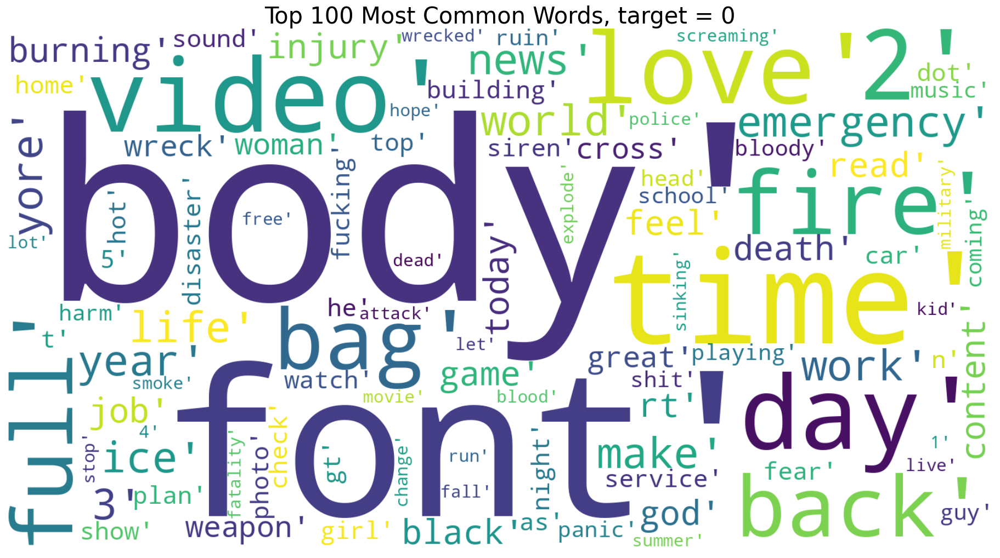

In [96]:
allwords_0 = df.groupby(['target']).get_group(0)['text'].str.split("[^\w+]").explode().tolist()
mostcommon = FreqDist(allwords_0).most_common(100)

wordcloud = WordCloud(width=1600, height=850, background_color='white').generate(str(mostcommon))
fig = plt.figure(figsize=(30,10), facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words, target = 0', fontsize=30)
plt.tight_layout(pad=0)

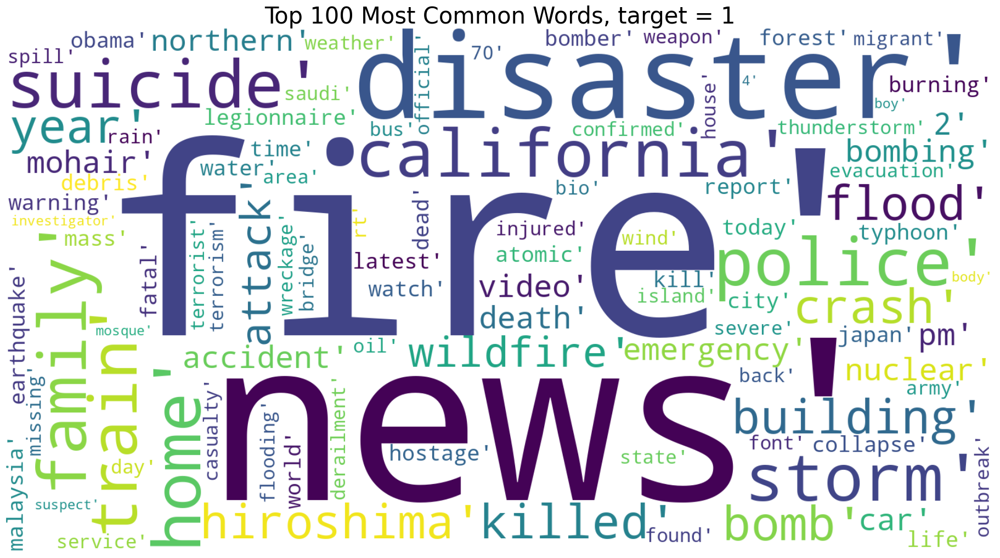

In [98]:
allwords_1 = df.groupby(['target']).get_group(1)['text'].str.split("[^\w+]").explode().tolist()
mostcommon = FreqDist(allwords_1).most_common(100)

wordcloud = WordCloud(width=1600, height=850, background_color='white').generate(str(mostcommon))
fig = plt.figure(figsize=(30,10), facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words, target = 1', fontsize=30)
plt.tight_layout(pad=0)

Text(0.5, 1.0, 'Frequency of 20 Most Common Words')

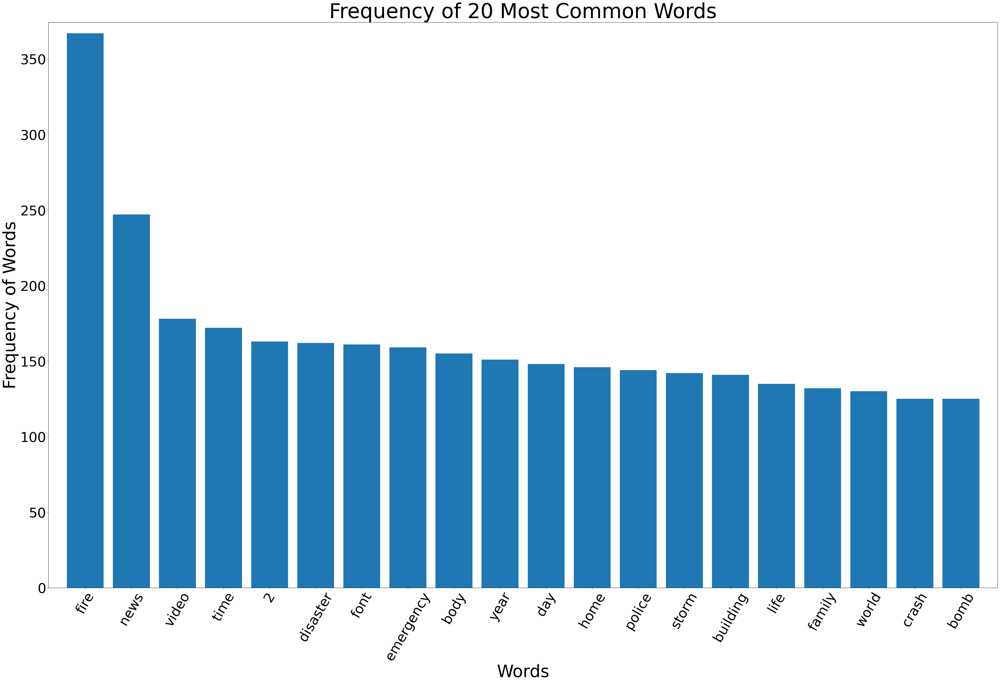

In [107]:
mostcommon_small = FreqDist(allwords).most_common(20)
x, y = zip(*mostcommon_small)
plt.figure(figsize=(50,30))
plt.margins(0.02)
plt.bar(x, y)
plt.xlabel('Words', fontsize=50)
plt.ylabel('Frequency of Words', fontsize=50)
plt.yticks(fontsize=40)
plt.xticks(rotation=60, fontsize=40)
plt.title('Frequency of 20 Most Common Words', fontsize=60)

Text(0.5, 1.0, 'Frequency of 20 Most Common Words, target = 0')

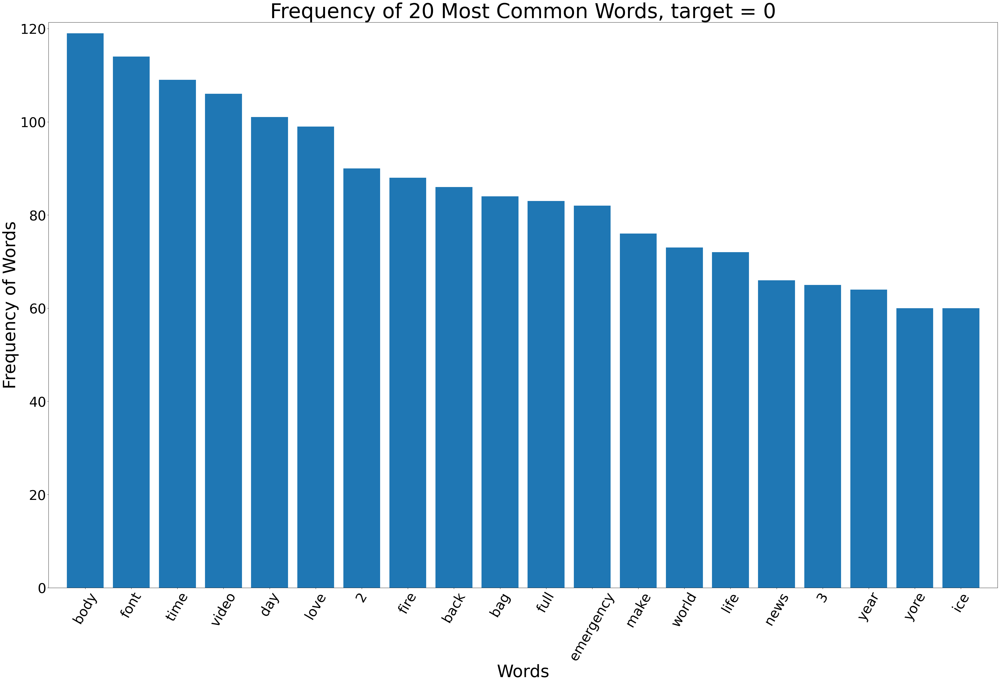

In [108]:
allwords_0 = df.groupby(['target']).get_group(0)['text'].str.split("[^\w+]").explode().tolist()
mostcommon_0 = FreqDist(allwords_0).most_common(20)
x, y = zip(*mostcommon_0)
plt.figure(figsize=(50,30))
plt.margins(0.02)
plt.bar(x, y)
plt.xlabel('Words', fontsize=50)
plt.ylabel('Frequency of Words', fontsize=50)
plt.yticks(fontsize=40)
plt.xticks(rotation=60, fontsize=40)
plt.title('Frequency of 20 Most Common Words, target = 0', fontsize=60)

Text(0.5, 1.0, 'Frequency of 20 Most Common Words, target = 1')

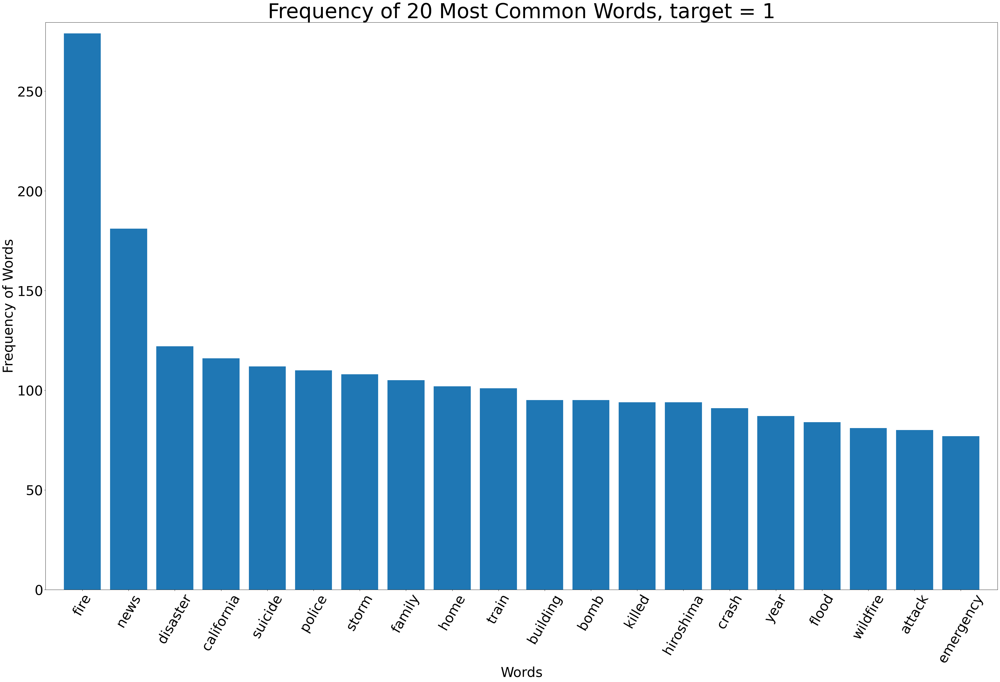

In [109]:
allwords_1 = df.groupby(['target']).get_group(1)['text'].str.split("[^\w+]").explode().tolist()
mostcommon_1 = FreqDist(allwords_1).most_common(20)
x, y = zip(*mostcommon_1)
plt.figure(figsize=(50,30))
plt.margins(0.02)
plt.bar(x, y)
plt.xlabel('Words',fontsize=40)
plt.ylabel('Frequency of Words',fontsize=40)
plt.yticks(fontsize=40)
plt.xticks(rotation=60, fontsize=40)
plt.title('Frequency of 20 Most Common Words, target = 1', fontsize=60)

Change dataset to mental_health

In [36]:
mh_df = pd.read_json('./results/mental_health', lines=True)

In [47]:
mh_df['hashtags_bin'] = mh_df.apply(lambda row: bin_classify(row, 'hashtags'), axis=1)
mh_df['emojis_bin'] = mh_df.apply(lambda row: bin_classify(row, 'emojis'), axis=1)
mh_df['links_bin'] = mh_df.apply(lambda row: bin_classify(row, 'links'), axis=1)
mh_df['references_bin'] = mh_df.apply(lambda row: bin_classify(row, 'references'), axis=1)
mh_df.head()

,Unnamed: 0,post_id,post_created,text,user_id,followers,friends,favourites,statuses,retweets,...,references,hashtags,emojis,polarity,subjectivity,sentiment,hashtags_bin,emojis_bin,links_bin,references_bin
0,0,637894677824413696,Sun Aug 30 07:48:37 +0000 2015,2 year diagnosed anxiety depression today taki...,1013187241,84,211,251,837,0,...,[],"[anxiety, depression]",[],0.100000,1.000000,Positive,1,0,0,0
1,1,637890384576778240,Sun Aug 30 07:31:33 +0000 2015,sunday break planning spend time possible a14,1013187241,84,211,251,837,1,...,[],[A14],[],-0.093750,0.750000,Negative,1,0,0,0
2,2,637749345908051968,Sat Aug 29 22:11:07 +0000 2015,awake tired sleep brain idea,1013187241,84,211,251,837,0,...,[],[],[],-0.262500,0.537500,Negative,0,0,0,0
3,3,637696421077123073,Sat Aug 29 18:40:49 +0000 2015,retro bear make perfect gift great beginner st...,1013187241,84,211,251,837,2,...,[],"[Retro, yay]",[],0.900000,0.875000,Positive,1,0,1,0
4,4,637696327485366272,Sat Aug 29 18:40:26 +0000 2015,hard packing list making life easier reinforci...,1013187241,84,211,251,837,1,...,[],"[movinghouse, anxiety]",[],-0.045833,0.370833,Negative,1,0,0,0


In [48]:
mh_df.info()
mh_df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 24 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      20000 non-null  int64  
 1   post_id         20000 non-null  int64  
 2   post_created    20000 non-null  object 
 3   text            20000 non-null  object 
 4   user_id         20000 non-null  int64  
 5   followers       20000 non-null  int64  
 6   friends         20000 non-null  int64  
 7   favourites      20000 non-null  int64  
 8   statuses        20000 non-null  int64  
 9   retweets        20000 non-null  int64  
 10  target          20000 non-null  int64  
 11  links           20000 non-null  object 
 12  is_retweet      20000 non-null  int64  
 13  retweet_of      20000 non-null  object 
 14  references      20000 non-null  object 
 15  hashtags        20000 non-null  object 
 16  emojis          20000 non-null  object 
 17  polarity        20000 non-null 

,Unnamed: 0,post_id,user_id,followers,friends,favourites,statuses,retweets,target,is_retweet,polarity,subjectivity,hashtags_bin,emojis_bin,links_bin,references_bin
count,20000.000000,2.000000e+04,2.000000e+04,20000.000000,20000.000000,20000.000000,2.000000e+04,20000.000000,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000
mean,9999.500000,6.874728e+17,3.548623e+16,900.483950,782.428750,6398.235550,4.439442e+04,1437.927300,0.500000,0.18525,0.061490,0.318576,0.121200,0.078650,0.420650,0.341100
std,5773.647028,1.708396e+17,1.606083e+17,1899.913961,1834.817945,8393.072914,1.407785e+05,15119.665118,0.500013,0.38851,0.288962,0.333407,0.326368,0.269198,0.493676,0.474091
min,0.000000,3.555966e+09,1.472438e+07,0.000000,0.000000,0.000000,3.000000e+00,0.000000,0.000000,0.00000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4999.750000,5.931686e+17,3.242944e+08,177.000000,211.000000,243.000000,5.129000e+03,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,9999.500000,7.637400e+17,1.052122e+09,476.000000,561.000000,2752.000000,1.325100e+04,0.000000,0.500000,0.00000,0.000000,0.233333,0.000000,0.000000,0.000000,0.000000
75%,14999.250000,8.153124e+17,2.285923e+09,1197.000000,701.000000,8229.000000,5.289200e+04,1.000000,1.000000,0.00000,0.168182,0.593750,0.000000,0.000000,1.000000,1.000000
max,19999.000000,8.194574e+17,7.631825e+17,28614.000000,28514.000000,39008.000000,1.063601e+06,839540.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Text(0.5, 1.0, 'Number of records by target')

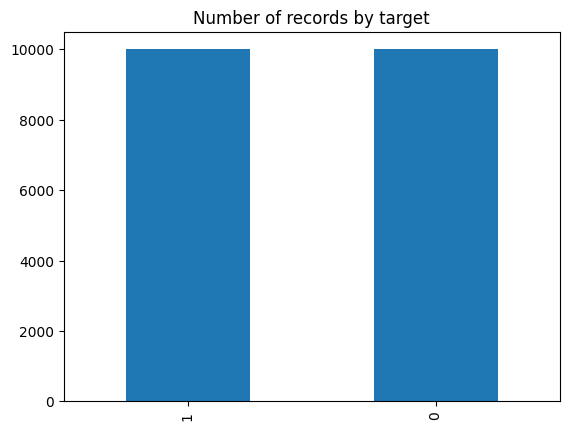

In [40]:
mh_df['target'].value_counts().plot(kind='bar')
plt.title('Number of records by target')

In [49]:
mh_df.isnull().sum()

Unnamed: 0        0
post_id           0
post_created      0
text              0
user_id           0
followers         0
friends           0
favourites        0
statuses          0
retweets          0
target            0
links             0
is_retweet        0
retweet_of        0
references        0
hashtags          0
emojis            0
polarity          0
subjectivity      0
sentiment         0
hashtags_bin      0
emojis_bin        0
links_bin         0
references_bin    0
dtype: int64

Text(0.5, 1.0, 'Polarity by target')

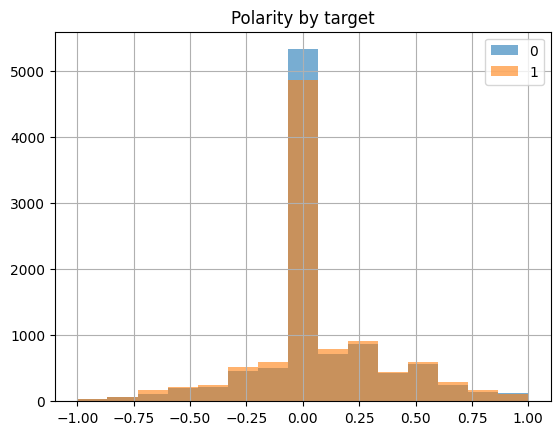

In [42]:
mh_df_grouped = mh_df.groupby('target')
mh_df_grouped['polarity'].hist(alpha=0.6, bins=15, legend=True)
plt.title('Polarity by target')

Text(0.5, 1.0, 'Subjectivity by target')

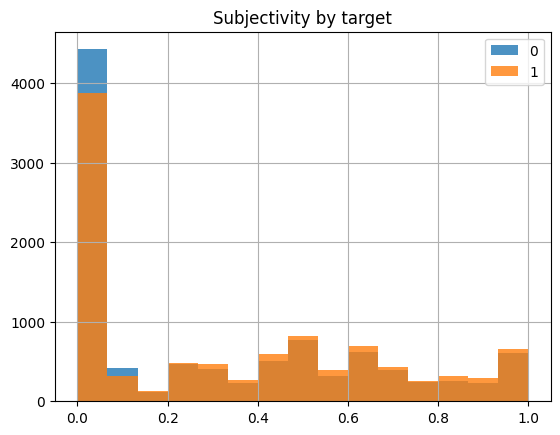

In [43]:
mh_df_grouped = mh_df.groupby('target')
mh_df_grouped['subjectivity'].hist(alpha=0.8, bins=15, legend=True)
plt.title('Subjectivity by target')

Text(0.5, 1.0, 'Sentiment by target')

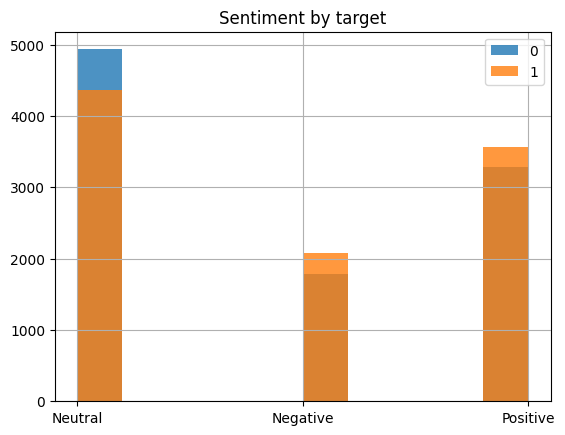

In [82]:
mh_df_grouped = mh_df.groupby('target')
mh_df_grouped['sentiment'].hist(alpha=0.8, legend=True )
plt.title('Sentiment by target')

Text(0.5, 1.0, 'Followers by target')

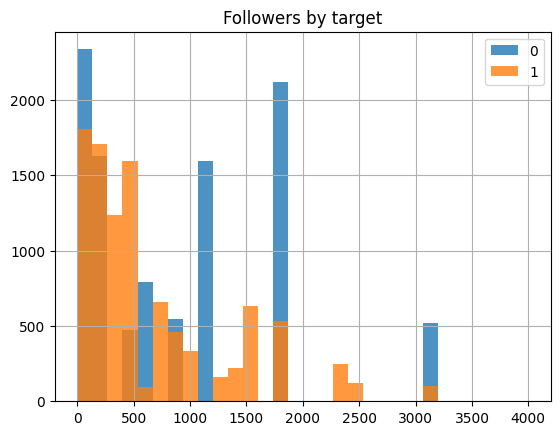

In [44]:
mh_df_grouped = mh_df.groupby('target')
mh_df_grouped['followers'].hist(alpha=0.8, bins=30, legend=True, range=[0, 4000])
plt.title('Followers by target')

<AxesSubplot: >

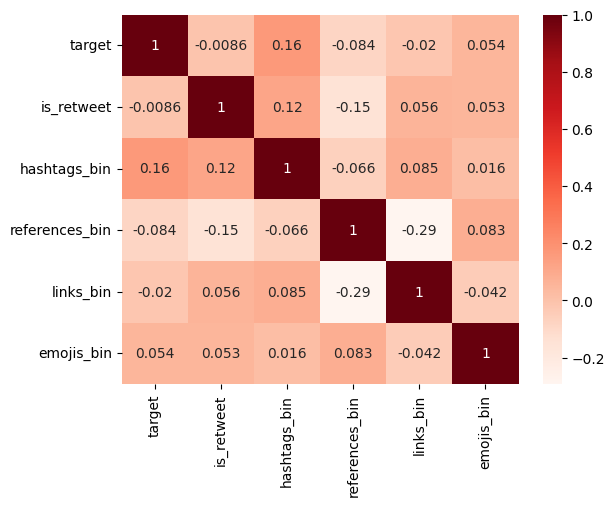

In [50]:
sns.heatmap(mh_df[['target', 'is_retweet','hashtags_bin','references_bin','links_bin','emojis_bin']].corr(), annot=True, cmap='Reds')

<AxesSubplot: title={'center': 'Hashtags presence, target = 1'}>

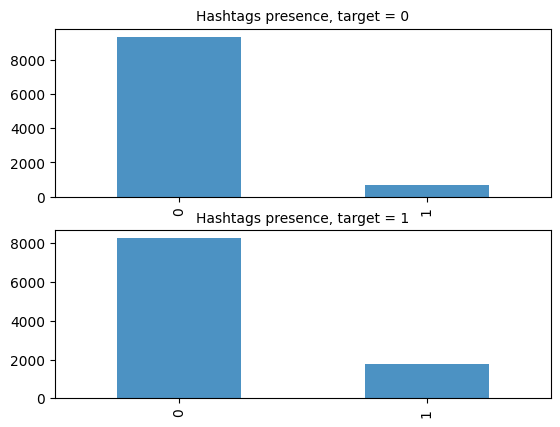

In [99]:
mh_df_grouped = mh_df.groupby('target')
plt.subplot(2,1,1)
plt.title('Hashtags presence, target = 0', fontsize=10)
mh_df_grouped['hashtags_bin'].get_group(0).value_counts().plot(kind='bar', alpha=0.8, xticks=(0,1))
plt.subplot(2,1,2)
plt.title('Hashtags presence, target = 1', fontsize=10)
mh_df_grouped['hashtags_bin'].get_group(1).value_counts().plot(kind='bar', alpha=0.8)

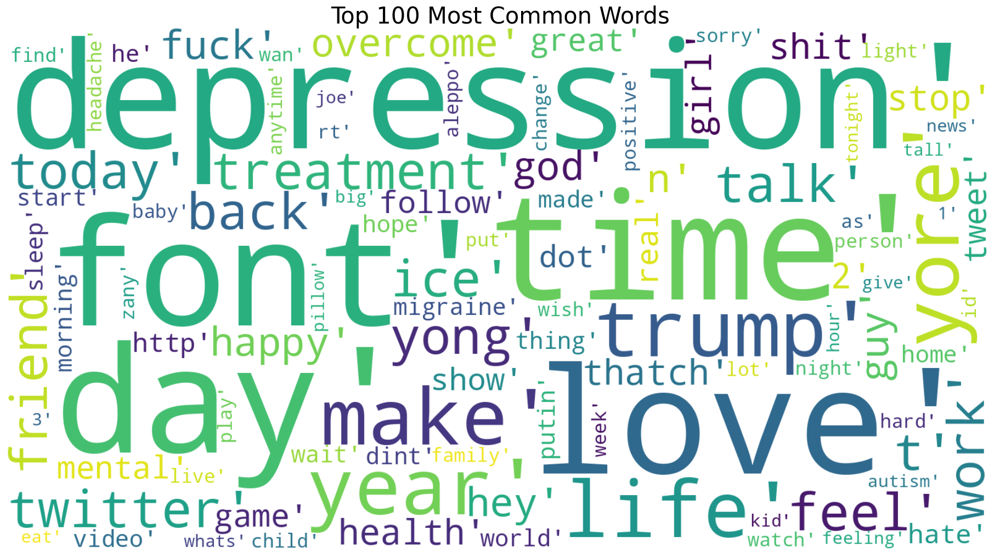

In [113]:
mh_df_notempty = mh_df.loc[mh_df['text'] != ""]
allwords = mh_df_notempty['text'].str.split("[^\w+]").explode().tolist()
mostcommon = FreqDist(allwords).most_common(100)

wordcloud = WordCloud(width=1600, height=850, background_color='white').generate(str(mostcommon))
fig = plt.figure(figsize=(30,10), facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=30)
plt.tight_layout(pad=0)

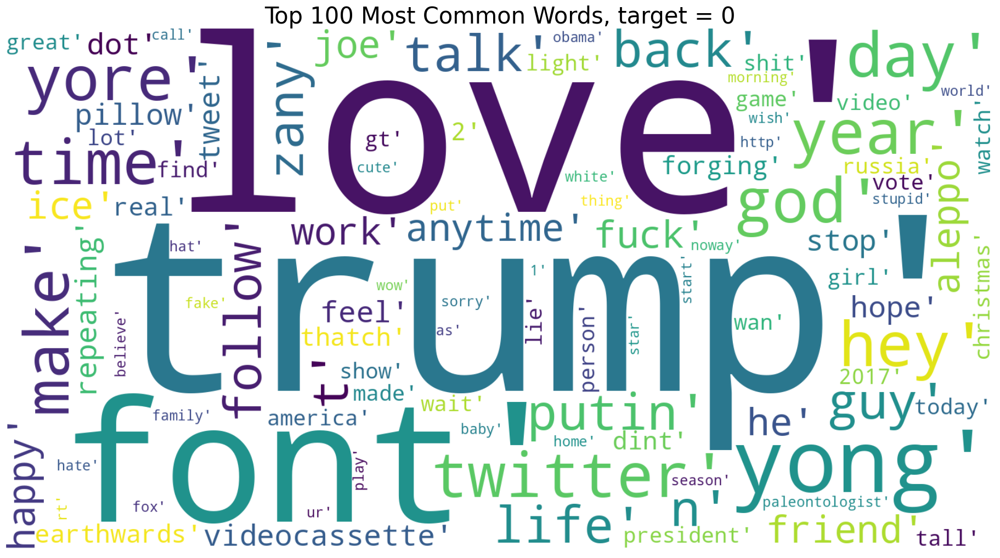

In [100]:
allwords_0 = mh_df.groupby(['target']).get_group(0)['text'].str.split("[^\w+]").explode().tolist()
mostcommon = FreqDist(allwords_0).most_common(100)

wordcloud = WordCloud(width=1600, height=850, background_color='white').generate(str(mostcommon))
fig = plt.figure(figsize=(30,10), facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words, target = 0', fontsize=30)
plt.tight_layout(pad=0)

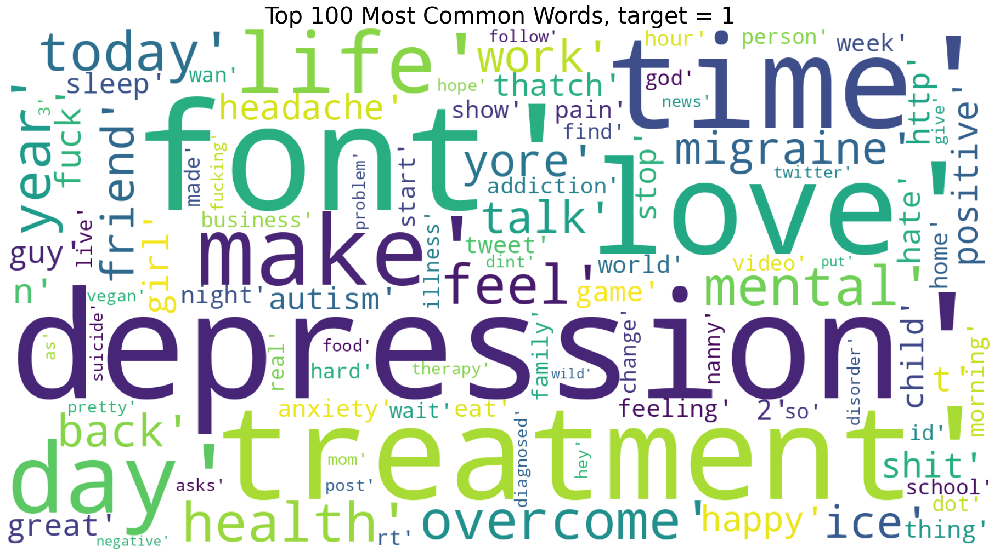

In [111]:
allwords_1 = mh_df.groupby(['target']).get_group(1)['text'].str.split("[^\w+]").explode().tolist()
mostcommon = FreqDist(allwords_1).most_common(100)

wordcloud = WordCloud(width=1600, height=850, background_color='white').generate(str(mostcommon))
fig = plt.figure(figsize=(30,10), facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words, target = 1', fontsize=30)
plt.tight_layout(pad=0)

Text(0.5, 1.0, 'Frequency of 20 Most Common Words')

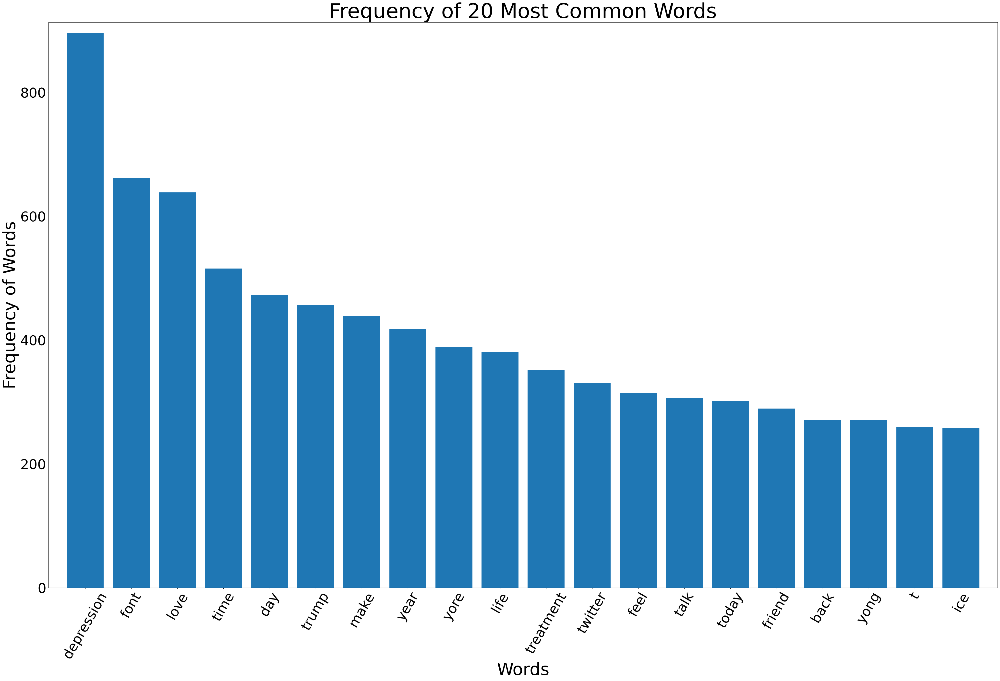

In [114]:
mostcommon_small = FreqDist(allwords).most_common(20)
x, y = zip(*mostcommon_small)
plt.figure(figsize=(50,30))
plt.margins(0.02)
plt.bar(x, y)
plt.xlabel('Words', fontsize=50)
plt.ylabel('Frequency of Words', fontsize=50)
plt.yticks(fontsize=40)
plt.xticks(rotation=60, fontsize=40)
plt.title('Frequency of 20 Most Common Words', fontsize=60)

Text(0.5, 1.0, 'Frequency of 20 Most Common Words, target = 0')

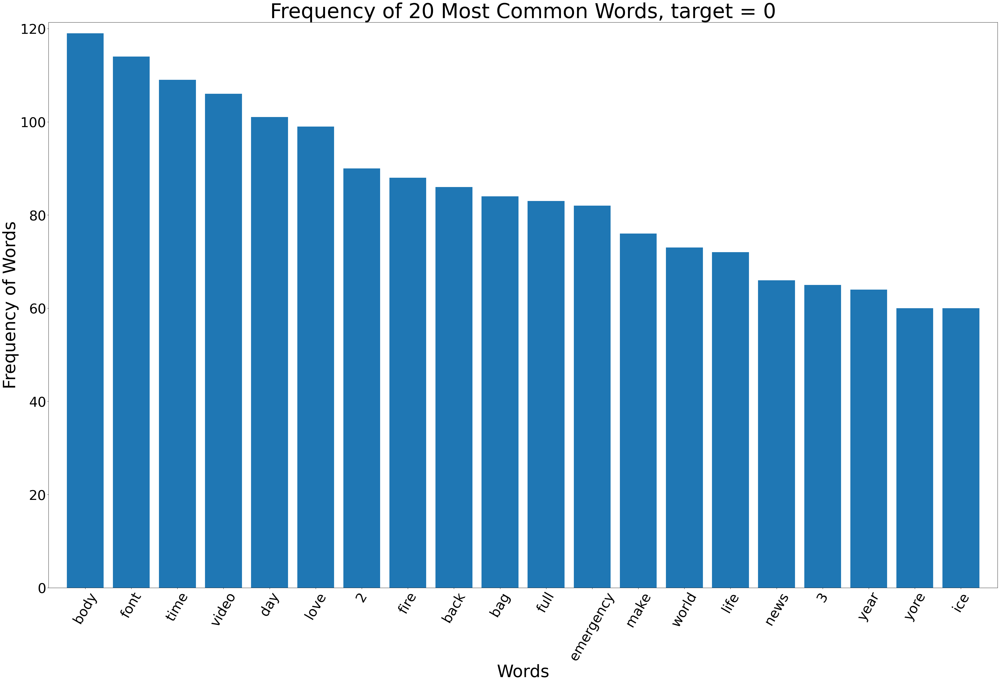

In [116]:
allwords_0 = df.groupby(['target']).get_group(0)['text'].str.split("[^\w+]").explode().tolist()
mostcommon_0 = FreqDist(allwords_0).most_common(20)
x, y = zip(*mostcommon_0)
plt.figure(figsize=(50,30))
plt.margins(0.02)
plt.bar(x, y)
plt.xlabel('Words', fontsize=50)
plt.ylabel('Frequency of Words', fontsize=50)
plt.yticks(fontsize=40)
plt.xticks(rotation=60, fontsize=40)
plt.title('Frequency of 20 Most Common Words, target = 0', fontsize=60)

Text(0.5, 1.0, 'Frequency of 20 Most Common Words, target = 1')

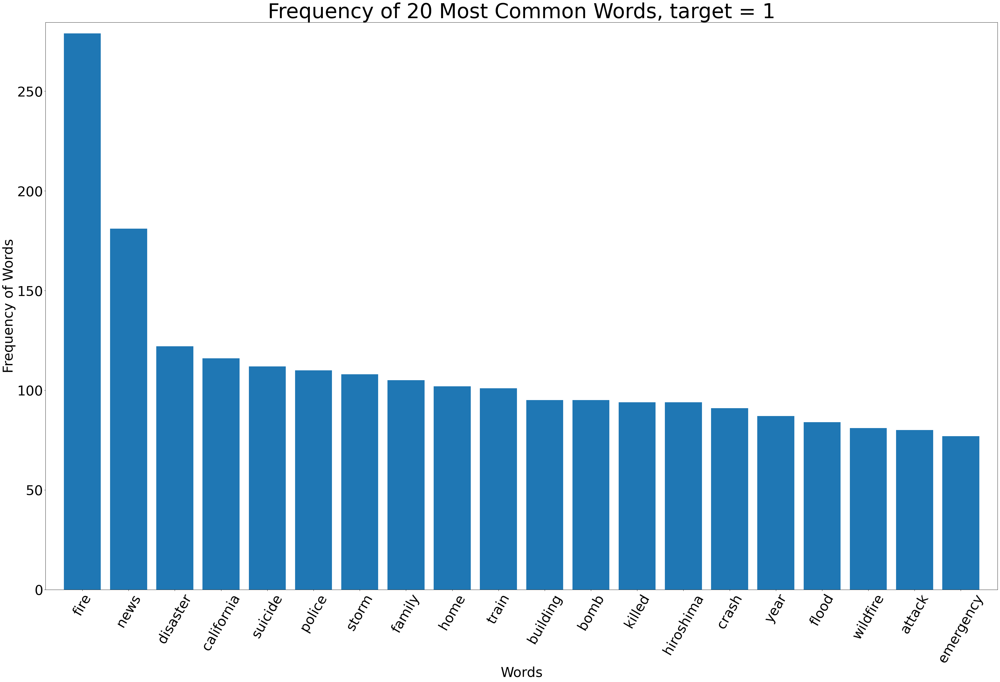

In [72]:
allwords_1 = df.groupby(['target']).get_group(1)['text'].str.split("[^\w+]").explode().tolist()
mostcommon_1 = FreqDist(allwords_1).most_common(20)
x, y = zip(*mostcommon_1)
plt.figure(figsize=(50,30))
plt.margins(0.02)
plt.bar(x, y)
plt.xlabel('Words',fontsize=40)
plt.ylabel('Frequency of Words',fontsize=40)
plt.yticks(fontsize=40)
plt.xticks(rotation=60, fontsize=40)
plt.title('Frequency of 20 Most Common Words, target = 1', fontsize=60)

Change dataset to suspiciuos communication

In [73]:
sc_df = pd.read_json('./results/suspicious_communiaction', lines=True)

In [74]:
sc_df['hashtags_bin'] = sc_df.apply(lambda row: bin_classify(row, 'hashtags'), axis=1)
sc_df['emojis_bin'] = sc_df.apply(lambda row: bin_classify(row, 'emojis'), axis=1)
sc_df['links_bin'] = sc_df.apply(lambda row: bin_classify(row, 'links'), axis=1)
sc_df['references_bin'] = sc_df.apply(lambda row: bin_classify(row, 'references'), axis=1)
sc_df.head()

,text,target,links,is_retweet,retweet_of,references,hashtags,emojis,polarity,subjectivity,sentiment,hashtags_bin,emojis_bin,links_bin,references_bin
0,fucking real,1,[],0,0,[],[],[],0.200000,0.300000,Positive,0,0,0,0
1,dirty crook revenge em fucking corrupt joke ma...,1,[],0,0,[],[],[],-0.550000,0.900000,Negative,0,0,0,0
2,fuck day let hour ping steed writing book,1,[],0,0,[],[],[],-0.200000,0.300000,Negative,0,0,0,0
3,font finish enclosing fucking shower hate half...,1,[],0,0,[],[],[],-0.491667,0.641667,Negative,0,0,0,0
4,wto talking thatch menage thatch gay,1,[],0,0,[],[],[],0.416667,0.583333,Positive,0,0,0,0


In [75]:
sc_df.info()
sc_df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20001 entries, 0 to 20000
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   text            20001 non-null  object 
 1   target          20001 non-null  int64  
 2   links           20001 non-null  object 
 3   is_retweet      20001 non-null  int64  
 4   retweet_of      20001 non-null  int64  
 5   references      20001 non-null  object 
 6   hashtags        20001 non-null  object 
 7   emojis          20001 non-null  object 
 8   polarity        20001 non-null  float64
 9   subjectivity    20001 non-null  float64
 10  sentiment       20001 non-null  object 
 11  hashtags_bin    20001 non-null  int64  
 12  emojis_bin      20001 non-null  int64  
 13  links_bin       20001 non-null  int64  
 14  references_bin  20001 non-null  int64  
dtypes: float64(2), int64(7), object(6)
memory usage: 2.3+ MB


,target,is_retweet,retweet_of,polarity,subjectivity,hashtags_bin,emojis_bin,links_bin,references_bin
count,20001.000000,20001.0,20001.0,20001.000000,20001.000000,20001.000000,20001.0,20001.000000,20001.000000
mean,0.391080,0.0,0.0,-0.051861,0.435707,0.011249,0.0,0.013799,0.026549
std,0.488005,0.0,0.0,0.341558,0.334489,0.105468,0.0,0.116660,0.160764
min,0.000000,0.0,0.0,-1.000000,0.000000,0.000000,0.0,0.000000,0.000000
25%,0.000000,0.0,0.0,-0.257143,0.000000,0.000000,0.0,0.000000,0.000000
50%,0.000000,0.0,0.0,0.000000,0.500000,0.000000,0.0,0.000000,0.000000
75%,1.000000,0.0,0.0,0.100000,0.700000,0.000000,0.0,0.000000,0.000000
max,1.000000,0.0,0.0,1.000000,1.000000,1.000000,0.0,1.000000,1.000000


Text(0.5, 1.0, 'Number of records by target')

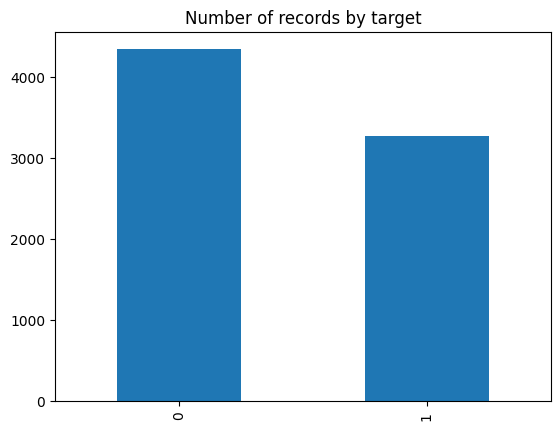

In [77]:
df['target'].value_counts().plot(kind='bar')
plt.title('Number of records by target')

Text(0.5, 1.0, 'Polarity by target')

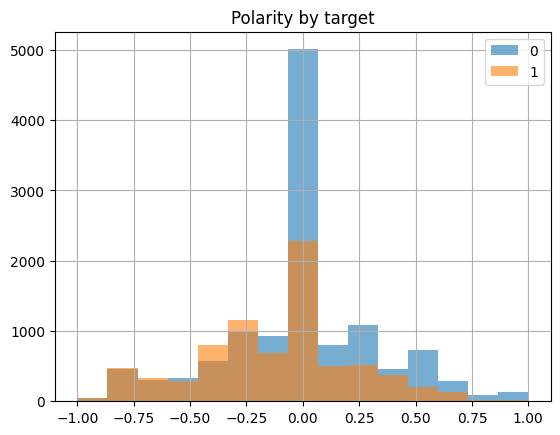

In [78]:
sc_df_grouped = sc_df.groupby('target')
sc_df_grouped['polarity'].hist(alpha=0.6, bins=15, legend=True)
plt.title('Polarity by target')

Text(0.5, 1.0, 'Subjectivity by target')

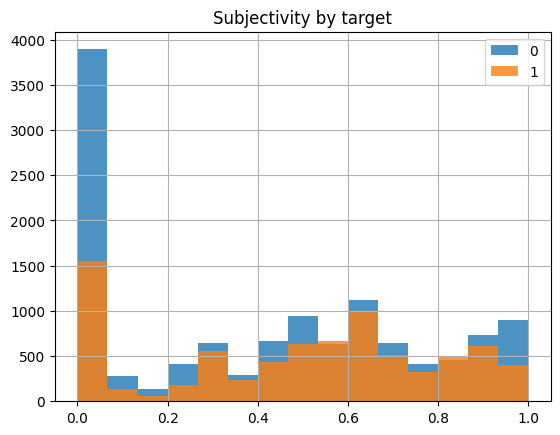

In [79]:
sc_df_grouped = sc_df.groupby('target')
sc_df_grouped['subjectivity'].hist(alpha=0.8, bins=15, legend=True )
plt.title('Subjectivity by target')

Text(0.5, 1.0, 'Sentiment by target')

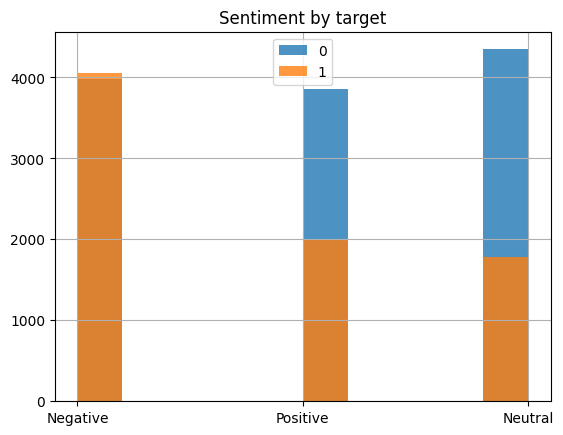

In [81]:
sc_df_grouped = sc_df.groupby('target')
sc_df_grouped['sentiment'].hist(alpha=0.8, legend=True )
plt.title('Sentiment by target')

<AxesSubplot: >

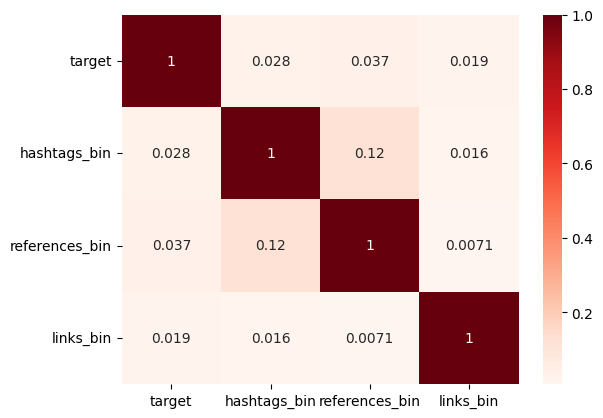

In [83]:
sns.heatmap(sc_df[['target','hashtags_bin','references_bin','links_bin']].corr(), annot=True, cmap='Reds')

<AxesSubplot: title={'center': 'Reference presence, target = 1'}>

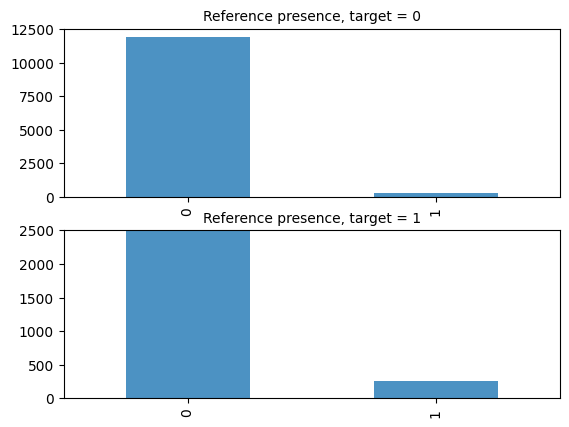

In [86]:
sc_df_grouped = sc_df.groupby('target')
plt.subplot(2,1,1)
plt.title('Reference presence, target = 0', fontsize=10)
sc_df_grouped['references_bin'].get_group(0).value_counts().plot(kind='bar', alpha=0.8, xticks=(0,1))
plt.subplot(2,1,2)
plt.title('Reference presence, target = 1', fontsize=10)
sc_df_grouped['references_bin'].get_group(1).value_counts().plot(kind='bar', alpha=0.8, ylim=(0,2500))

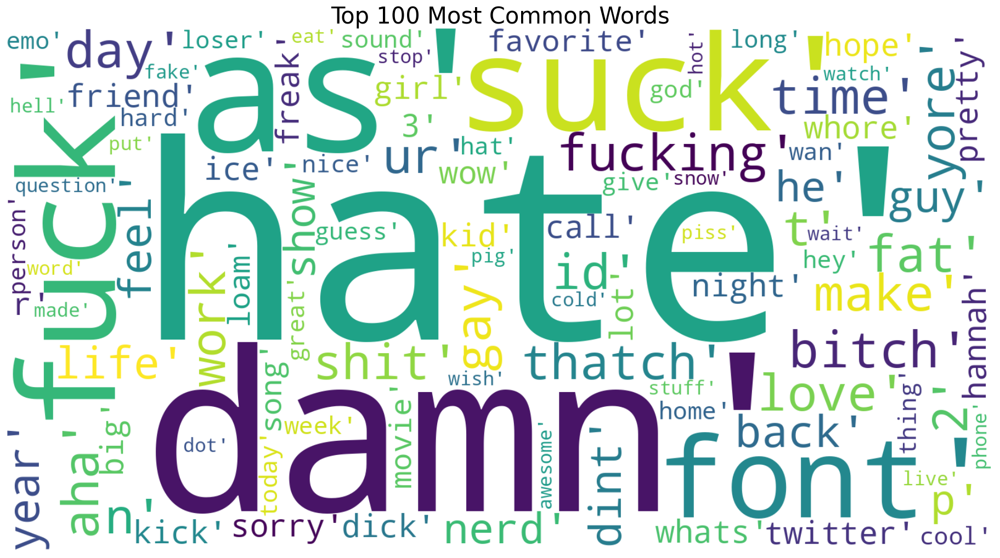

In [117]:
sc_df_notempty = sc_df.loc[sc_df['text'] != ""]
allwords = sc_df_notempty['text'].str.split("[^\w+]").explode().tolist()
mostcommon = FreqDist(allwords).most_common(100)

wordcloud = WordCloud(width=1600, height=850, background_color='white').generate(str(mostcommon))
fig = plt.figure(figsize=(30,10), facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=30)
plt.tight_layout(pad=0)

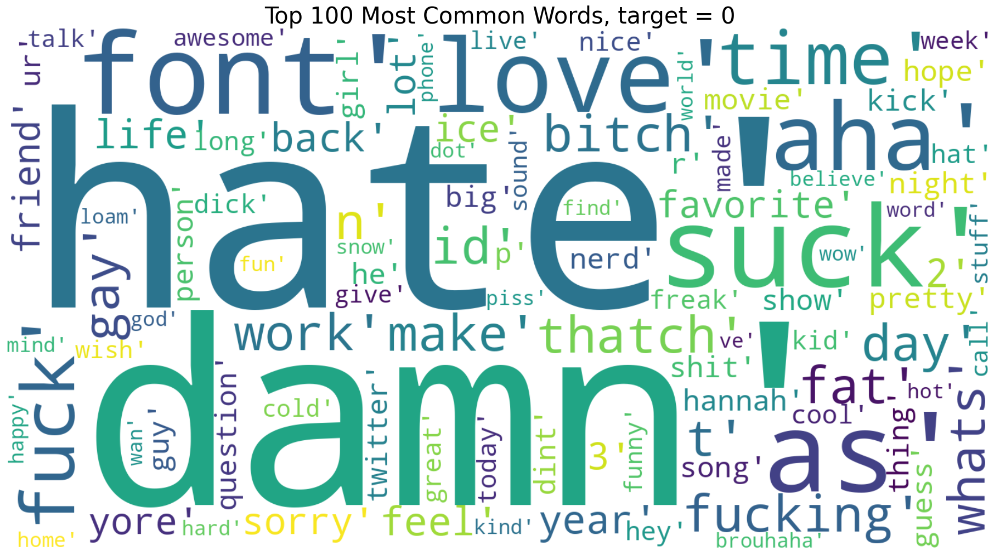

In [102]:
allwords_0 = sc_df.groupby(['target']).get_group(0)['text'].str.split("[^\w+]").explode().tolist()
mostcommon = FreqDist(allwords_0).most_common(100)

wordcloud = WordCloud(width=1600, height=850, background_color='white').generate(str(mostcommon))
fig = plt.figure(figsize=(30,10), facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words, target = 0', fontsize=30)
plt.tight_layout(pad=0)

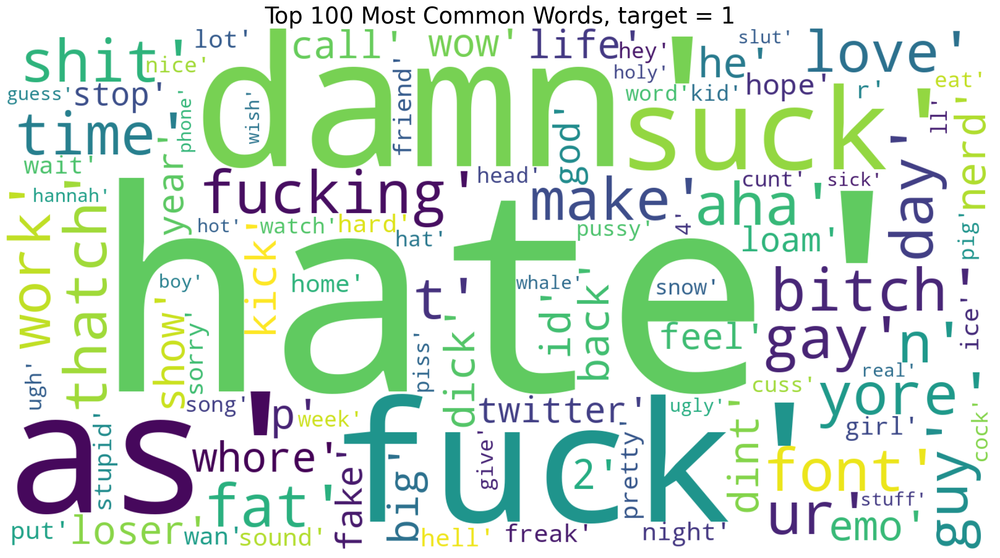

In [103]:
allwords_1 = sc_df.groupby(['target']).get_group(1)['text'].str.split("[^\w+]").explode().tolist()
mostcommon = FreqDist(allwords_1).most_common(100)

wordcloud = WordCloud(width=1600, height=850, background_color='white').generate(str(mostcommon))
fig = plt.figure(figsize=(30,10), facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words, target = 1', fontsize=30)
plt.tight_layout(pad=0)

Text(0.5, 1.0, 'Frequency of 20 Most Common Words')

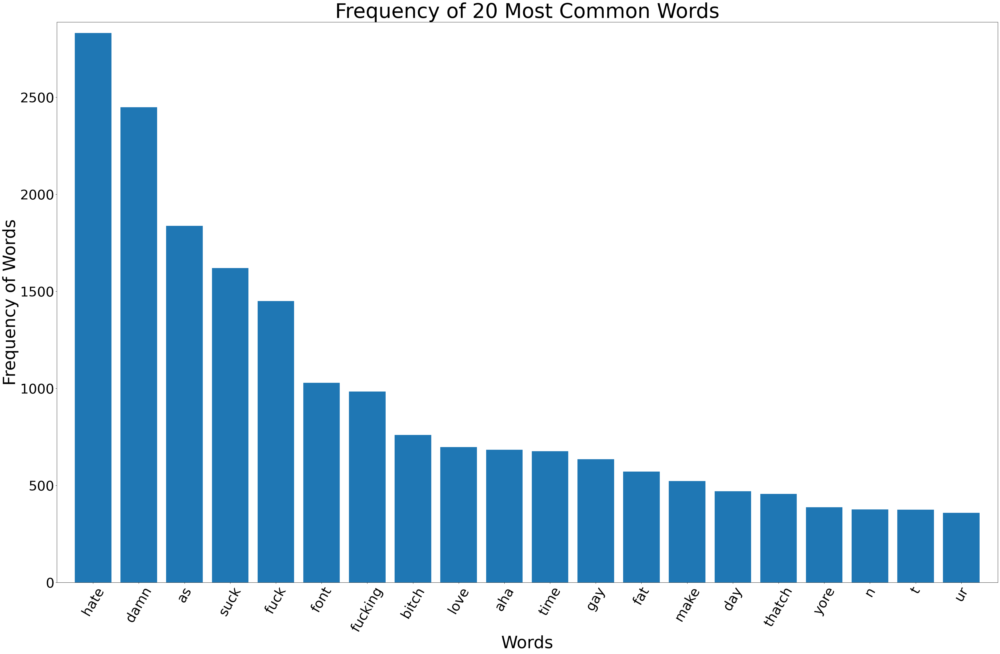

In [105]:
mostcommon_small = FreqDist(allwords).most_common(20)
x, y = zip(*mostcommon_small)
plt.figure(figsize=(50,30))
plt.margins(0.02)
plt.bar(x, y)
plt.xlabel('Words', fontsize=50)
plt.ylabel('Frequency of Words', fontsize=50)
plt.yticks(fontsize=40)
plt.xticks(rotation=60, fontsize=40)
plt.title('Frequency of 20 Most Common Words', fontsize=60)

Text(0.5, 1.0, 'Frequency of 20 Most Common Words, target = 0')

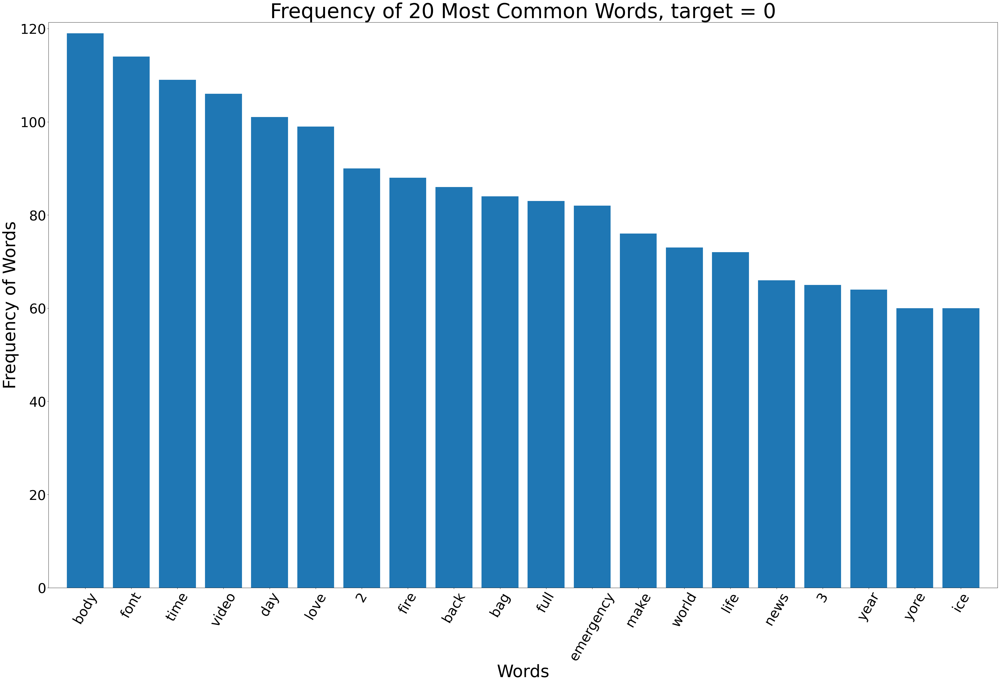

In [92]:
allwords_0 = df.groupby(['target']).get_group(0)['text'].str.split("[^\w+]").explode().tolist()
mostcommon_0 = FreqDist(allwords_0).most_common(20)
x, y = zip(*mostcommon_0)
plt.figure(figsize=(50,30))
plt.margins(0.02)
plt.bar(x, y)
plt.xlabel('Words', fontsize=50)
plt.ylabel('Frequency of Words', fontsize=50)
plt.yticks(fontsize=40)
plt.xticks(rotation=60, fontsize=40)
plt.title('Frequency of 20 Most Common Words, target = 0', fontsize=60)

Text(0.5, 1.0, 'Frequency of 20 Most Common Words, target = 1')

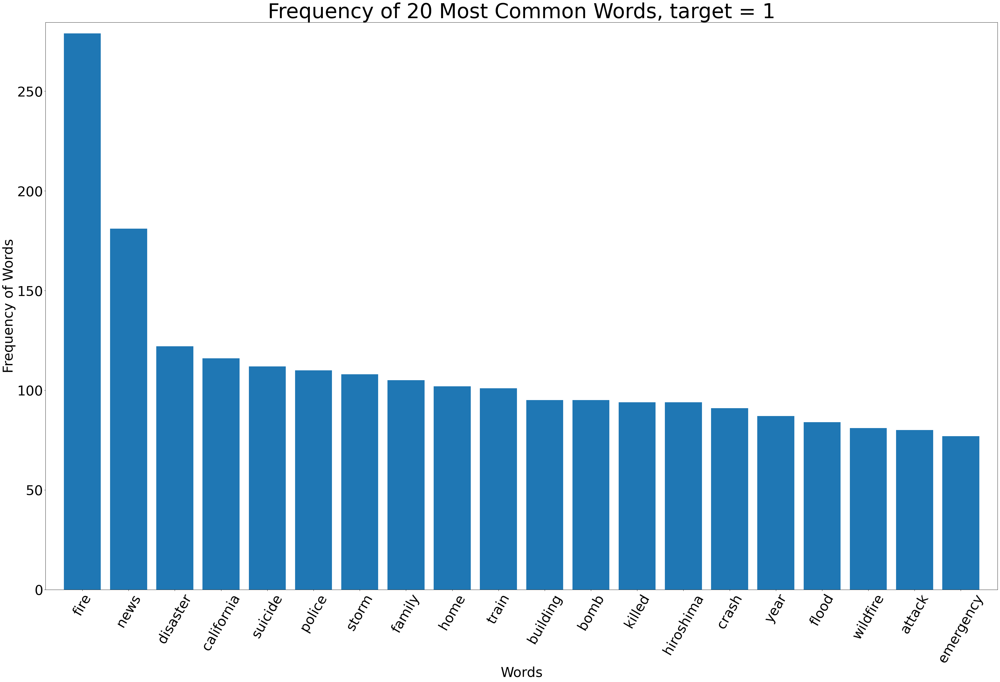

In [93]:
allwords_1 = df.groupby(['target']).get_group(1)['text'].str.split("[^\w+]").explode().tolist()
mostcommon_1 = FreqDist(allwords_1).most_common(20)
x, y = zip(*mostcommon_1)
plt.figure(figsize=(50,30))
plt.margins(0.02)
plt.bar(x, y)
plt.xlabel('Words',fontsize=40)
plt.ylabel('Frequency of Words',fontsize=40)
plt.yticks(fontsize=40)
plt.xticks(rotation=60, fontsize=40)
plt.title('Frequency of 20 Most Common Words, target = 1', fontsize=60)